# Vehicle Detection and Tracking

## Importing Libraries

In [2]:
import glob
import random
import cv2
import matplotlib.image as mpimg
from helpers import*
from skimage.feature import hog
import numpy
import numpy as np
import scipy
from pyDOE import*
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from scipy.ndimage.measurements import label
import pandas as pd
from pandas.plotting import table
import pickle
from moviepy.editor import VideoFileClip
from IPython.display import HTML

%load_ext autoreload
%autoreload 2

### Note on possible runtime issues with pyDOE library
* **If `pyDOE` cannot be imported then try the following in the terminal**
    * `pip install --upgrade pyDOE`
* **If the following error occurs:**
    * TypeError: 'numpy.float64' object cannot be interpreted as an integer
        * `pip install -U numpy==1.11.0`

## Loading Car and Non-Car Images

In [2]:
print("Loading Images...\n")
car_imgs_paths = glob.glob('/data/vehicles/*/*.png')
non_car_imgs_paths = glob.glob('/data/non-vehicles/*/*.png')
print(len(car_imgs_paths),'Car Images and ',len(non_car_imgs_paths),' Non-Car Images were loaded.')

Loading Images...

8792 Car Images and  8968  Non-Car Images were loaded.


### Visualizing Sample Car Images

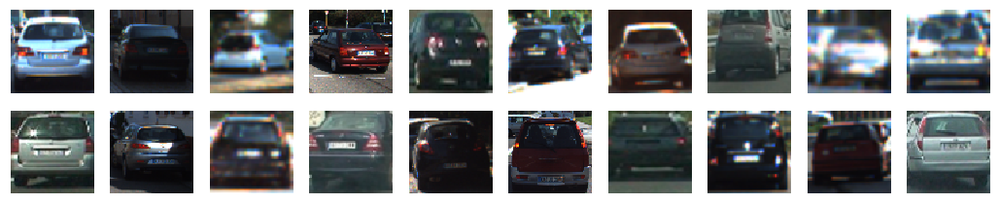

In [3]:
car_imgs = [mpimg.imread(path) for path in random.sample(car_imgs_paths,20)]
plot_images(car_imgs,(2,10),(20,3),save_plot=0,filepath='output_images/20_sample_car_images')

### Visualizing Sample Non-Car Images

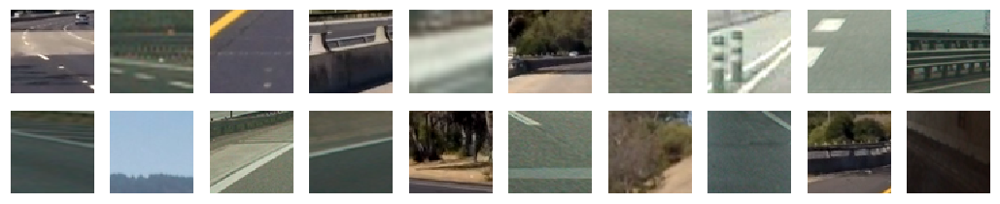

In [4]:
non_car_imgs = [mpimg.imread(path) for path in random.sample(non_car_imgs_paths,20)]
plot_images(non_car_imgs,(2,10),(20,3),save_plot=0,filepath='output_images/20_sample_non_car_images')

## Function to convert image to Histogram of Oriented Gradients (HOG)
_Source: Udacity SDCEN Lessons_

In [3]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False, feature_vec=True):
    
    # This option returns the visualization of the hog image
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, block_norm="L2-Hys",
                                  visualise=vis, feature_vector=feature_vec)        
        return features, hog_image

    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, block_norm="L2-Hys",
                       visualise=vis, feature_vector=feature_vec)
        return features

### Testing `get_hog_features()` function on a sample image

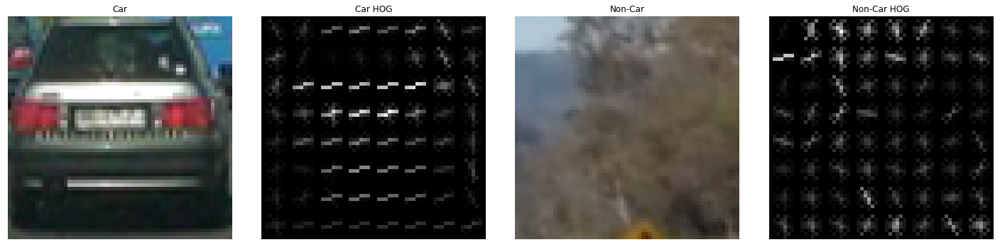

In [4]:
index = 5
imgs = []

test_car_img = mpimg.imread((car_imgs_paths[index]))
imgs.append(test_car_img)
_,car_hog = get_hog_features(test_car_img[:,:,2], 9, 8, 8, vis=True, feature_vec=True)
imgs.append(car_hog)

test_non_car_img = mpimg.imread((non_car_imgs_paths[index]))
imgs.append(test_non_car_img)
_,non_car_hog = get_hog_features(test_non_car_img[:,:,2], 9, 8, 8, vis=True, feature_vec=True)
imgs.append(non_car_hog)

titles = ['Car','Car HOG','Non-Car','Non-Car HOG']
cmap = [None,'gray',None,'gray']

plot_images(imgs,(1,4),(20,6),titles,cmap,save_plot=0,filepath='output_images/sample_hog_images')

## Function for Spatial Binning
_Source: Udacity SDCEN Lessons_

In [5]:
def bin_spatial(img, size=(32, 32)):
    # Using cv2.resize().ravel() to create the feature vector
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    # Return the features
    return np.hstack((color1, color2, color3))

## Function to compute RGB feature vector
_Source: Udacity SDCEN Lessons_

In [6]:
def color_hist(img, nbins=32, bins_range=(0, 256)):
    
    # Computes the histogram of the RGB color channels separately
    r_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    g_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    b_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    
    # Concatenates the 3 histograms into a single feature vector
    hist_features = np.concatenate((r_hist[0], g_hist[0], b_hist[0]))
    
    # Returns the single feature vector
    return hist_features

## Function to extract Features

_Source: Udacity SDCEN Lessons_

In [7]:
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
                #print('converting to YCrCb')
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

## Parameter Exploration using Design of Experiments

### Defining 
* Parameters for exploration
* Their value ranges to be explored
* Possible parameter combinations for experimentation

In [7]:
color_space = ['RGB', 'HSV', 'LUV', 'HLS', 'YUV', 'YCrCb'] #Parameters for Exploration

spatial_feat = [True] #Parameters kept as default
spatial_size = [(32,32)] #Parameters kept as default

hist_feat = [True] #Parameters kept as default
hist_bins = [32] #Parameters kept as default

hog_feat = [True] #Parameters kept as default
hog_channel = ['0','1','2','ALL'] #Parameters for Exploration
orient = [10,12] #Parameters for Exploration
pix_per_cell = [12,16] #Parameters for Exploration
cell_per_block = [2,3] #Parameters for Exploration

doe = [color_space,hog_channel,orient,pix_per_cell,cell_per_block] #Parameters for Exploration
print('Variable set for experimentation:\n',doe)

levels = [len(item) for item in doe]
print('\nLevels for each variable set:\n',levels)

design_table = fullfact(levels) #Creating DOE table

print('\nTotal combination of variables available for experimentation: ',len(design_table))

# Generating the Design of Experiments Table as an Image for Visualization
configs = []
for row in design_table:
    configs.append([color_space[int(row[0])] ,
                 hog_channel[int(row[1])],
                 orient[int(row[2])],
                 pix_per_cell[int(row[3])],
                 cell_per_block[int(row[4])]])

headers=['Colorspace','HOG Channel','Orientations', 'Pixels/Cell', 'Cells/Block']
df = pd.DataFrame(data=configs,index=[(i+1) for i in range (len(configs))],columns=headers)
pd.set_option('display.max_rows', len(configs))
pd.set_option('colheader_justify', 'centre')
pd.set_option('precision', 3)

#Creating a Markdown file for the dataframe
cols = df.columns
df2 = pd.DataFrame([['---',]*len(cols)], columns=cols)
df3 = pd.concat([df2, df])
df3.to_csv("data/configs.md", sep="|", index=False)

df #Outputs the dataframe

Variable set for experimentation:
 [['RGB', 'HSV', 'LUV', 'HLS', 'YUV', 'YCrCb'], ['0', '1', '2', 'ALL'], [10, 12], [12, 16], [2, 3]]

Levels for each variable set:
 [6, 4, 2, 2, 2]

Total combination of variables available for experimentation:  192


/opt/conda/lib/python3.6/site-packages/pyDOE/doe_factorial.py:78: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  rng = lvl*range_repeat


,Colorspace,HOG Channel,Orientations,Pixels/Cell,Cells/Block
1,RGB,0,10,12,2
2,HSV,0,10,12,2
3,LUV,0,10,12,2
4,HLS,0,10,12,2
5,YUV,0,10,12,2
6,YCrCb,0,10,12,2
7,RGB,1,10,12,2
8,HSV,1,10,12,2
9,LUV,1,10,12,2
10,HLS,1,10,12,2


In [9]:
def parameter_exploration(config_no,configurations,sample_cars,sample_non_cars,n_predict=20,svc_save=False):
    
    data_path = "data/doe_results_"+str(config_no)+".p"
    
    if os.path.isfile(data_path):
        return print("File already exists here: ", data_path)
    
    else:
        if type(config_no) != int:
            raise TypeError("Argument `config_no` should be of integer type")
        if config_no <= 0:
            raise ValueError("Argument `config_no` should have values greater than `0`")
        
    #Default Parameters
    spatial_feat = True
    spatial_size = (32,32)
    hist_feat = True
    hist_bins = 32
    hog_feat = True
    
    svc_data = []
    X_scaler_data = []
    
    no_configs = len(configurations)
    print("Experiment initiated on "+str(no_configs)+" configurations...\n")
        
    for i,config in enumerate(configurations):
        
        print(str(i+1)+"-",end="")

        #Parameter Definition as per various configurations
        color_space = config[0]
        hog_channel = config[1]
        orient = config[2]
        pix_per_cell = config[3]
        cell_per_block = config[4]
        
        t=time.time() #Timer Starts
        
        car_features = extract_features(sample_cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)

        notcar_features = extract_features(sample_non_cars, color_space=color_space, 
                        spatial_size=spatial_size, hist_bins=hist_bins, 
                        orient=orient, pix_per_cell=pix_per_cell, 
                        cell_per_block=cell_per_block, 
                        hog_channel=hog_channel, spatial_feat=spatial_feat, 
                        hist_feat=hist_feat, hog_feat=hog_feat)
        
        feature_compute_time = round((time.time()-t),3) #Seconds to extract features
        configurations[i].append(feature_compute_time)
        
        X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
        # Fit a per-column scaler
        X_scaler = StandardScaler().fit(X)
        # Apply the scaler to X
        scaled_X = X_scaler.transform(X)

        # Define the labels vector
        y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))
        
        # Split up data into randomized training and test sets
        rand_state = np.random.randint(0, 100)
        X_train, X_test, y_train, y_test = train_test_split(
            scaled_X, y, test_size=0.2, random_state=rand_state)
        
        feature_vector_len = len(X_train[0]) #Feature vector length
        configurations[i].append(feature_vector_len)
        
        # Use a linear SVC 
        svc = LinearSVC()
        # Check the training time for the SVC
        t = time.time()
        svc.fit(X_train, y_train)
        t2 = time.time()
        
        time_to_train = round(t2-t, 2) #Seconds to train SVC
        configurations[i].append(time_to_train)
        
        # Check the score of the SVC
        test_accuracy = round(svc.score(X_test, y_test), 4) #Test Accuracy of SVC
        configurations[i].append(test_accuracy)
        
        # Check the prediction time for a small sample set
        t=time.time()
        svc.predict(X_test[0:n_predict])
        t2 = time.time()
        
        predict_time = round(t2-t, 5) #Seconds to predict
        configurations[i].append(predict_time)
        
        if svc_save == True:
            svc_data.append(svc)
            X_scaler_data.append(X_scaler)
            
    print('\n\nExperimentation completed.\nSaving data...')
    
    data = {'car_img_paths' : sample_cars, 
            'non_car_img_paths': sample_non_cars,
            'default' : [spatial_feat, spatial_size,hist_feat,hist_bins,hog_feat,n_predict],
            'svc': svc_data, 
            'scaler': X_scaler_data,
            'configurations' : configurations}
    try:
        with open(data_path, "wb") as f:
                pickle.dump(data, f)
    finally:
        print("Generated file can be found here : ",data_path,"\n")
        f.close()
     
    return

# Helper Function
def pickle_load(path):
    if os.path.isfile(path):
        print("Loading Files...")
        with open(path, mode='rb') as f:
            data = pickle.load(f)
        print("Files Successfully Loaded from: ",path,"\n")
        return data['svc'], data['scaler'], data['default'], data['configurations']
    else:
        print("File Not Found at path: ",path,"\n")
        return None, None

### Running all the configurations through `parameter_exploration()` on a sample size of 1000 images

In [9]:
experiment = False #To prevent accidental re-running of cell
config_no = None
sample_size = None

if experiment == True:
    sample_cars = random.sample(car_imgs_paths,sample_size) 
    sample_non_cars = random.sample(non_car_imgs_paths,sample_size)
    
    if len(configs[0])!=5:
        print("WARNING --- Re-run `fullfact()` and try again.")
    else:
        parameter_exploration(config_no,configs,sample_cars,sample_non_cars)

In [10]:
config_no = '1'
_,_,default_param, config_results = pickle_load('data/doe_results_'+config_no+'.p')

#Visualizing the Data
headers=['Colorspace','HOG Channel','Orientations', 'Pixels/Cell', 'Cells/Block','Feature Compute Secs',
        'Feature Vector Length', 'Training Secs', 'Test Accuracy','Predict Secs']
df = pd.DataFrame(data=config_results,index=[(i+1) for i in range (len(config_results))],columns=headers)
pd.set_option('display.max_rows', len(config_results))
pd.set_option('colheader_justify', 'centre')
pd.set_option('precision', 3)

#Creating a Markdown file for the dataframe
cols = df.columns
df2 = pd.DataFrame([['---',]*len(cols)], columns=cols)
df3 = pd.concat([df2, df])
df3.to_csv("data/config_results_"+config_no+".md", sep="|", index=False)

df #Outputs the dataframe

Loading Files...
Files Successfully Loaded from:  data/doe_results_1.p 



,Colorspace,HOG Channel,Orientations,Pixels/Cell,Cells/Block,Feature Compute Secs,Feature Vector Length,Training Secs,Test Accuracy,Predict Secs
1,RGB,0,10,12,2,7.122,3808,5.10,0.938,2.000e-04
2,HSV,0,10,12,2,4.707,3808,1.73,0.938,1.800e-04
3,LUV,0,10,12,2,4.672,3808,2.32,0.932,1.700e-04
4,HLS,0,10,12,2,5.144,3808,1.61,0.938,1.600e-04
5,YUV,0,10,12,2,4.617,3808,3.07,0.950,1.500e-04
6,YCrCb,0,10,12,2,4.532,3808,3.25,0.940,1.300e-04
7,RGB,1,10,12,2,4.497,3808,4.91,0.922,1.600e-04
8,HSV,1,10,12,2,4.556,3808,1.54,0.928,1.800e-04
9,LUV,1,10,12,2,4.797,3808,3.36,0.960,2.400e-04
10,HLS,1,10,12,2,4.721,3808,2.68,0.955,1.300e-04


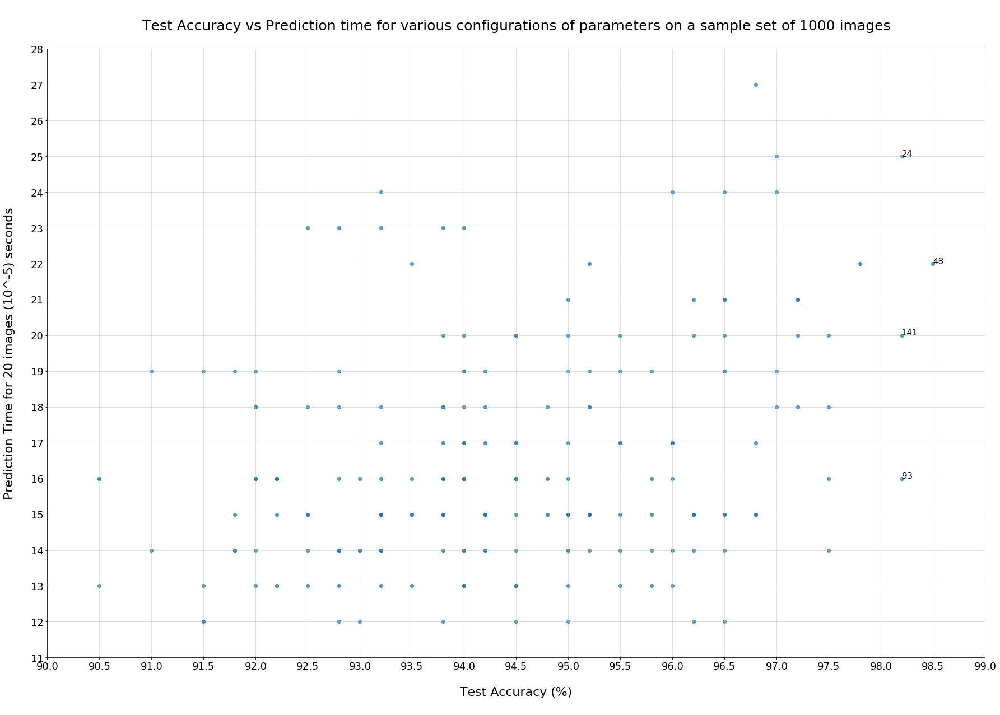

In [11]:
x = []
y = []
labels = []

for i,row in enumerate(config_results):
    x.append(row[8]*100)
    y.append(row[9]*100000)
    labels.append(i+1)
    
height = 30
width = 20
plt.rcParams["figure.figsize"] = [height,width]

fig, ax = plt.subplots()
ax.scatter(x, y, alpha=0.75)

for i, label in enumerate(labels):
    if x[i]>98:
        ax.annotate(label, (x[i], y[i]),fontsize = 15)

# Plot formatting
plt.grid(axis='y', alpha=0.5)
plt.grid(axis='x', alpha=0.5)

plt.xlabel('\nTest Accuracy (%)\n',fontsize = 22)
plt.xticks(np.linspace(90,99,19),fontsize = 18)

plt.ylabel('Prediction Time for 20 images (10^-5) seconds\n',fontsize = 22)
plt.yticks(np.linspace(11,28,18),fontsize = 18)

plt.title('\nTest Accuracy vs Prediction time for various configurations of parameters on a sample set of 1000 images\n',
          fontsize = 25)
plt.savefig('output_images/test_accu_vs_predict_time_1000_samples')
plt.show()

### Shortlisting Configurations that resulted in Test Accuracy above 98%

In [12]:
short_list = [config_results[92],config_results[140],config_results[47],config_results[23]]

#Visualizing the Data
headers=['Colorspace','HOG Channel','Orientations', 'Pixels/Cell', 'Cells/Block','Feature Compute Secs',
        'Feature Vector Length', 'Training Secs', 'Test Accuracy','Predict Secs']
df = pd.DataFrame(data=short_list,index=[(i+1) for i in range (len(short_list))],columns=headers)
pd.set_option('display.max_rows', len(short_list))
pd.set_option('colheader_justify', 'centre')
pd.set_option('precision', 3)

#Creating a Markdown file for the dataframe
cols = df.columns
df2 = pd.DataFrame([['---',]*len(cols)], columns=cols)
df3 = pd.concat([df2, df])
df3.to_csv("data/config_results_"+"short_list"+".md", sep="|", index=False)

df #Outputs the dataframe

,Colorspace,HOG Channel,Orientations,Pixels/Cell,Cells/Block,Feature Compute Secs,Feature Vector Length,Training Secs,Test Accuracy,Predict Secs
1,LUV,ALL,12,16,2,8.515,4464,2.13,0.982,1.600e-04
2,LUV,ALL,12,12,3,8.355,6084,5.97,0.982,2.000e-04
3,YCrCb,ALL,12,12,2,9.387,5472,1.86,0.985,2.200e-04
4,YCrCb,ALL,10,12,2,9.592,5088,5.98,0.982,2.500e-04


### Testing the best two configurations on complete Data Set for more accurate results

In [13]:
experiment = False #To prevent accidental re-running of cell
config_no = 3
configs = [short_list[0][:5],short_list[2][:5]]

if experiment == True:
    if len(configs[0])!=5:
        print("WARNING --- Re-run `short_list` and try again.")
    else:
        parameter_exploration(config_no,configs,car_imgs_paths,non_car_imgs_paths,svc_save=True)
    

Experiment initiated on 2 configurations...

1-2-

Experimentation completed.
Saving data...
Generated file can be found here :  data/doe_results_3.p 



In [14]:
config_no = '3'
_,_,default_param, config_results = pickle_load('data/doe_results_'+config_no+'.p')

#Visualizing the Data
headers=['Colorspace','HOG Channel','Orientations', 'Pixels/Cell', 'Cells/Block','Feature Compute Secs',
        'Feature Vector Length', 'Training Secs', 'Test Accuracy','Predict Secs']
df = pd.DataFrame(data=config_results,index=[(i+1) for i in range (len(config_results))],columns=headers)
pd.set_option('display.max_rows', len(config_results))
pd.set_option('colheader_justify', 'centre')
pd.set_option('precision', 3)

#Creating a Markdown file for the dataframe
cols = df.columns
df2 = pd.DataFrame([['---',]*len(cols)], columns=cols)
df3 = pd.concat([df2, df])
df3.to_csv("data/config_results_"+config_no+".md", sep="|", index=False)

df #Outputs the dataframe

Loading Files...
Files Successfully Loaded from:  data/doe_results_3.p 



,Colorspace,HOG Channel,Orientations,Pixels/Cell,Cells/Block,Feature Compute Secs,Feature Vector Length,Training Secs,Test Accuracy,Predict Secs
1,LUV,ALL,12,16,2,95.384,4464,24.35,0.98,0.002
2,YCrCb,ALL,12,12,2,102.318,5472,51.71,0.98,0.007


## Final Parameters Selected for Feature Extraction

In [144]:
config_no = '3'
svc,X_scaler,default_param, config_results = pickle_load('data/doe_results_'+config_no+'.p')

final = 0 #The final configuration from the above list of two candidates.

headers=['Colorspace',
         'Spatial Features','Spatial Size',
         'Hist Features','Hist Bins',
         'Hog Feature','HOG Channel','Orientations', 'Pixels/Cell', 'Cells/Block']

final_param = [config_results[final][0]]+default_param[0:5]+config_results[final][1:5]


#Visualizing the Data
df = pd.DataFrame(data=[final_param],index=['Values'],columns=headers)
pd.set_option('colheader_justify', 'centre')
pd.set_option('precision', 3)

#Creating a Markdown file for the dataframe
cols = df.columns
df2 = pd.DataFrame([['---',]*len(cols)], columns=cols)
df3 = pd.concat([df2, df])
df3.to_csv("data/final_config.md", sep="|", index=False)

#Assigning Final Values
color_space = final_param[0]

spatial_feat = final_param[1]
spatial_size = final_param[2]

hist_feat = final_param[3]
hist_bins = final_param[4]

hog_feat = final_param[5]
hog_channel = final_param[6]
orient = final_param[7]
pix_per_cell = final_param[8]
cell_per_block = final_param[9]

svc = svc[final]
X_scaler = X_scaler[final]

df #Outputs the dataframe

Loading Files...
Files Successfully Loaded from:  data/doe_results_3.p 



,Colorspace,Spatial Features,Spatial Size,Hist Features,Hist Bins,Hog Feature,HOG Channel,Orientations,Pixels/Cell,Cells/Block
Values,LUV,True,"(32, 32)",True,32,True,ALL,12,16,2


## Classifier to Detect Cars in an Image

In [145]:
def find_cars(img, ystart, ystop, scale, cspace, hog_channel, svc, X_scaler, orient, 
              pix_per_cell, cell_per_block, spatial_size, hist_bins, show_all_rectangles=False):
    
    # array of rectangles where cars were detected
    rectangles = []
    
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:,:]

    # apply color conversion if other than 'RGB'
    if cspace != 'RGB':
        if cspace == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    else: ctrans_tosearch = np.copy(image)   
    
    # rescale image if other than 1.0 scale
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
    
    # select colorspace channel for HOG 
    if hog_channel == 'ALL':
        ch1 = ctrans_tosearch[:,:,0]
        ch2 = ctrans_tosearch[:,:,1]
        ch3 = ctrans_tosearch[:,:,2]
    else: 
        ch1 = ctrans_tosearch[:,:,hog_channel]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell)+1  #-1
    nyblocks = (ch1.shape[0] // pix_per_cell)+1  #-1 
    nfeat_per_block = orient*cell_per_block**2
    
    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell)-1 
    
    # A cells_per_step = 2 would result in a search window overlap of 75% 
    #(2 is 25% of 8, so we move 25% each time, leaving 75% overlap with the previous window).
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)   
    if hog_channel == 'ALL':
        hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
        hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            # Extract HOG for this patch
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            if hog_channel == 'ALL':
                hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            else:
                hog_features = hog_feat1

            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            #Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
          
            #Get color features
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1,-1))   
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1 or show_all_rectangles:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                rectangles.append(((xbox_left, ytop_draw+ystart),(xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    return rectangles

### Loading and Visualizing Test Images

Loading Test Images...
Shape of the images:  (720, 1280, 3)


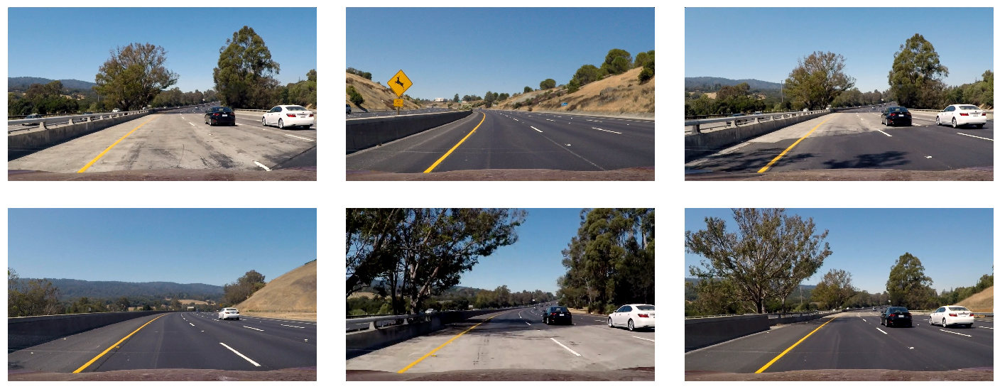

In [295]:
print("Loading Test Images...")
test_imgs_paths = glob.glob('test_images/*.jpg')
test_imgs = [mpimg.imread(path) for path in test_imgs_paths]
print("Shape of the images: ",np.shape(test_imgs[0]))
plot_images(test_imgs,(2,3),(20,8),save_plot=1,filepath='output_images/test_images_vis')

In [15]:
#Function to fill area between the lines

def fill(x1,x2,y1,y2,color='cyan',ax=plt):
    x = [x1,x2]
    y1 = [y1,y1]
    y2 = [y2,y2]
    ax.fill_between(x, y1, y2, color=color, alpha='0.5')
    return

### Visualizing the Region of Interest to Search for Cars

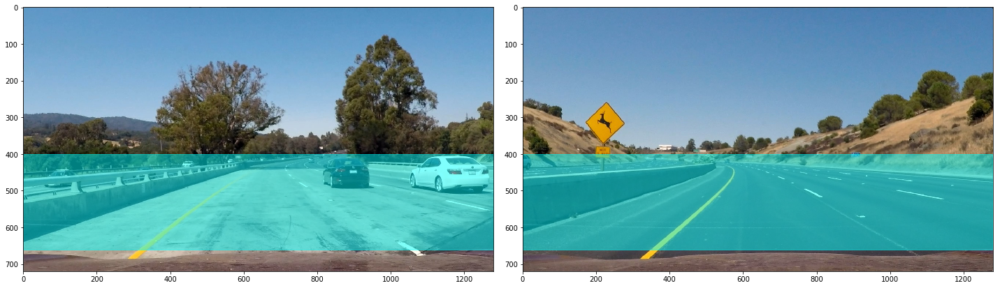

In [301]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
plt.tight_layout()

test_img = test_imgs[0]
ax1.imshow(test_img)
fill(0,1279,400,660,'cyan',ax1)

test_img = test_imgs[1]
ax2.imshow(test_img)
fill(0,1279,400,660,'cyan',ax2)

plt.show()
f.savefig('output_images/roi',dpi=75,bbox_inches='tight',pad_inches=0.2)
plt.close(fig)

### Function to draw bounding boxes 
_Source: Udacity SDCEN Lessons_

In [16]:
def draw_boxes(img, bboxes, color=(0,255,150), thick=3):
    # Make a copy of the image
    imcopy = np.copy(img)
    random_color = False
    # Iterate through the bounding boxes
    for bbox in bboxes:
        if color == 'random' or random_color:
            color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
            random_color = True
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

### Function to assist the visualization of outputs while exploring parameters 

In [17]:
def param_visual(ystart,ystop,scale,file):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
    f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
    plt.tight_layout()

    test_img = test_imgs[0]
    rectangles = find_cars(test_img, ystart, ystop, scale, color_space, hog_channel, 
                                               svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, 
                                               hist_bins,show_all_rectangles=False)
    test_img_rects = draw_boxes(test_img,rectangles)
    title = 'Parameters: (ystart : {}) , (ystop : {}) , (scale : {})'.format(ystart,ystop,scale)
    ax1.set_title(title,fontsize=18)
    ax1.imshow(test_img_rects)
    fill(0,1279,ystart,ystop,'cyan',ax1)

    test_img = test_imgs[3]
    rectangles = find_cars(test_img, ystart, ystop, scale, color_space, hog_channel, 
                                               svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, 
                                               hist_bins,show_all_rectangles=False)
    test_img_rects = draw_boxes(test_img,rectangles)
    title = 'Parameters: (ystart : {}) , (ystop : {}) , (scale : {})'.format(ystart,ystop,scale)
    ax2.set_title(title,fontsize=18)
    ax2.imshow(test_img_rects)
    fill(0,1279,ystart,ystop,'cyan',ax2)

    plt.show()
    f.savefig('output_images/'+file,dpi=75,bbox_inches='tight',pad_inches=0.2)
    plt.close(fig)
    return

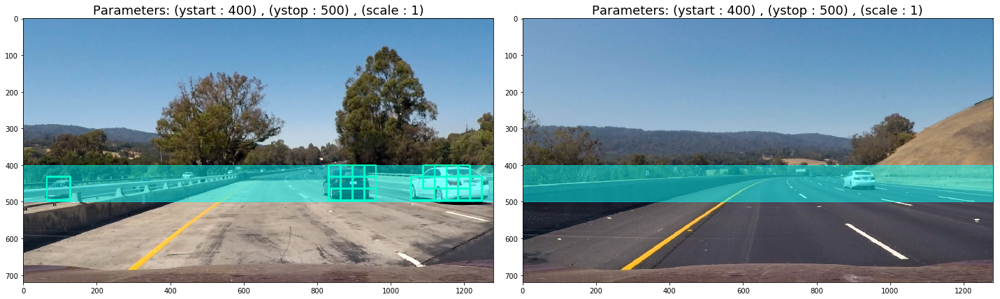

In [287]:
param_visual(400,500,1,'400_500_1')

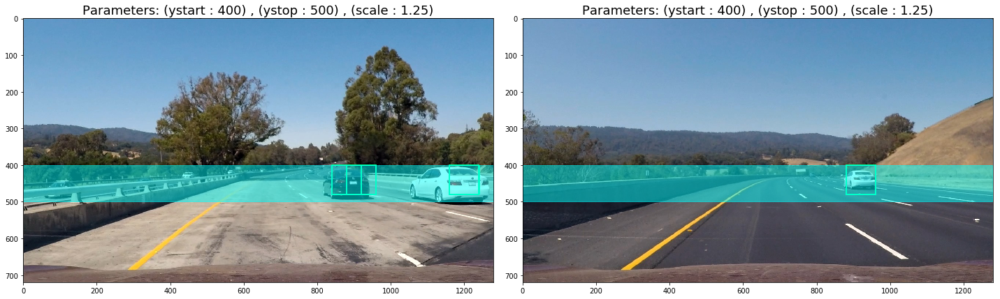

In [288]:
param_visual(400,500,1.25,'400_500_1-25')

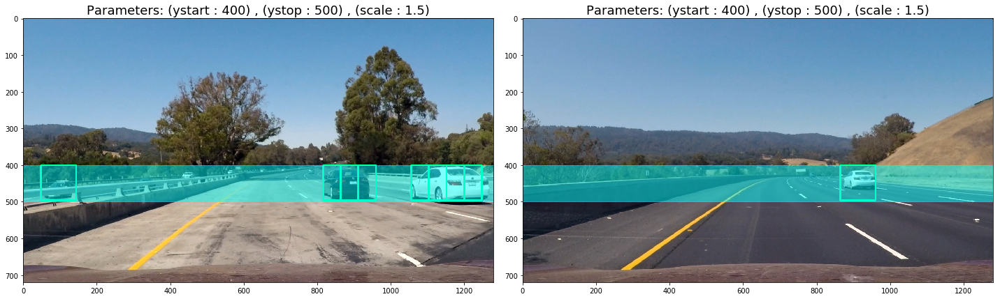

In [289]:
param_visual(400,500,1.5,'400_500_1-5')

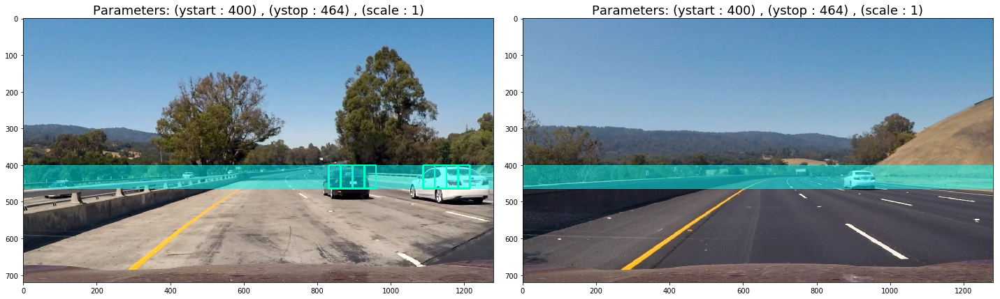

In [290]:
param_visual(400,464,1,'400_464_1')

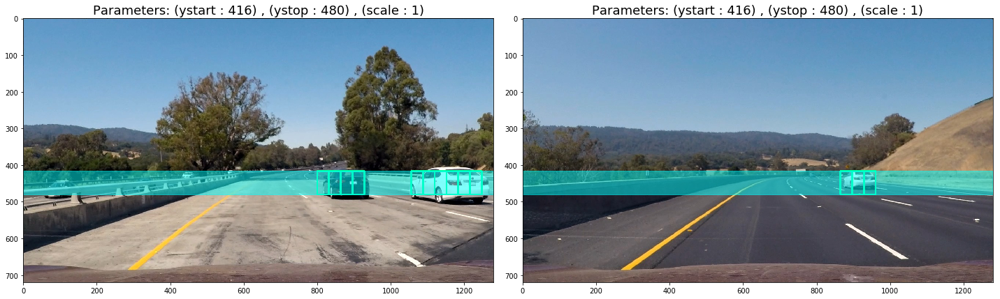

In [292]:
param_visual(416,480,1,'416_480_1')

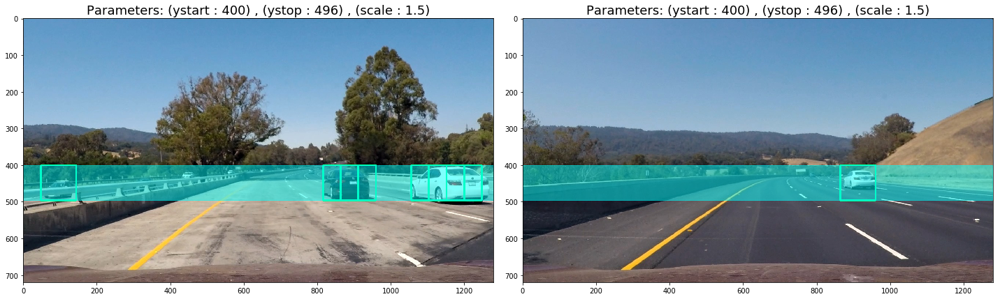

In [293]:
param_visual(400,496,1.5,'400_496_1-5')

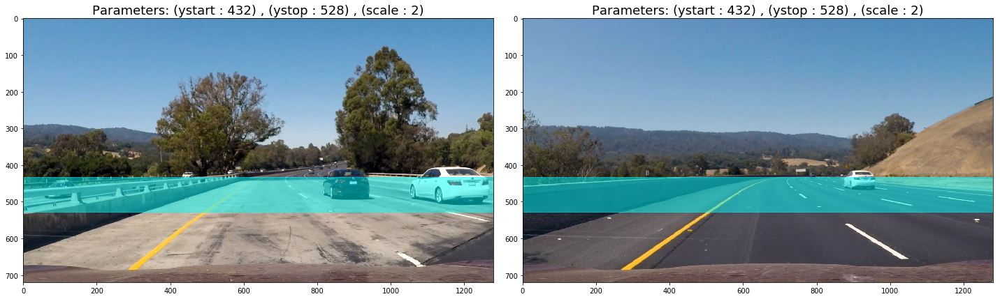

In [296]:
param_visual(432,528,2,'432_528_2')

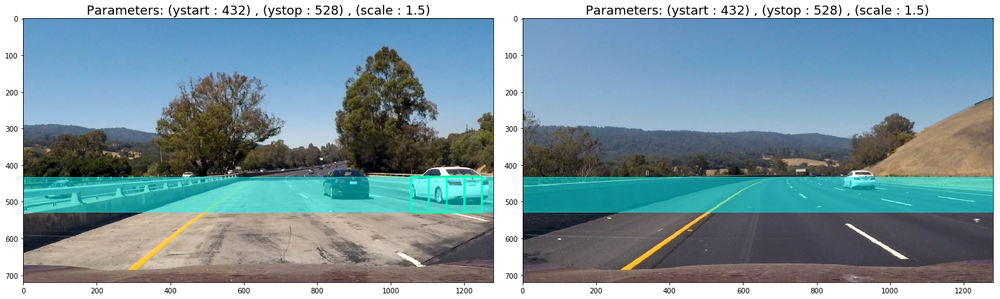

In [295]:
param_visual(432,528,1.5,'432_528_1-5')

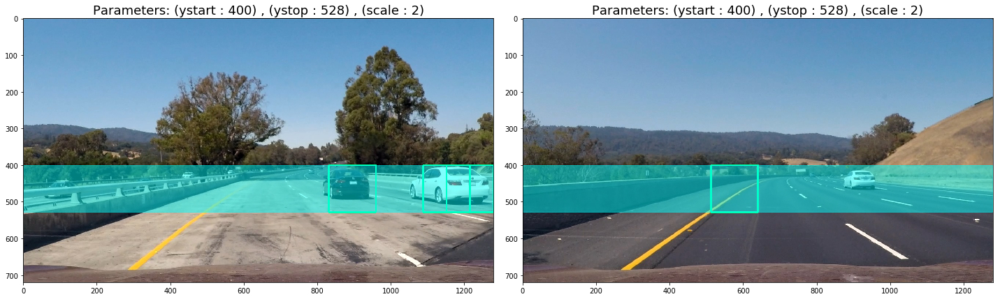

In [297]:
param_visual(400,528,2,'400_528_2')

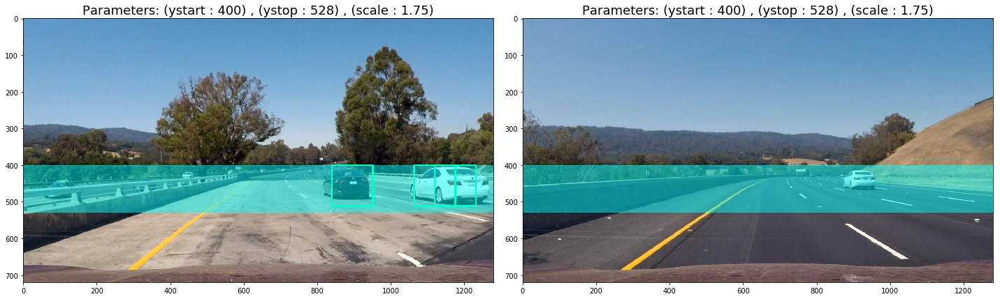

In [306]:
param_visual(400,528,1.75,'400_528_1-75')

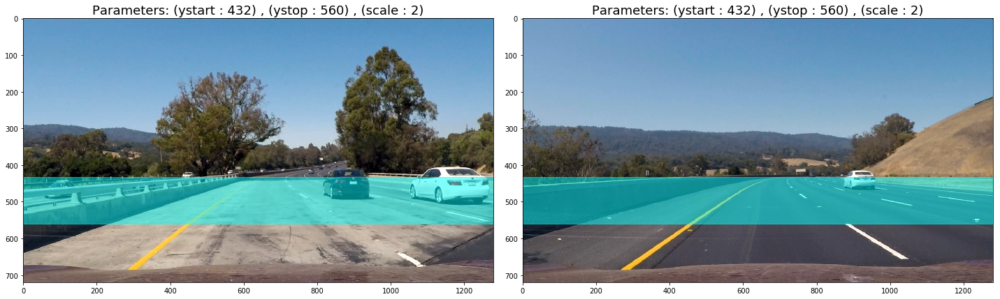

In [298]:
param_visual(432,560,2,'432_560_2')

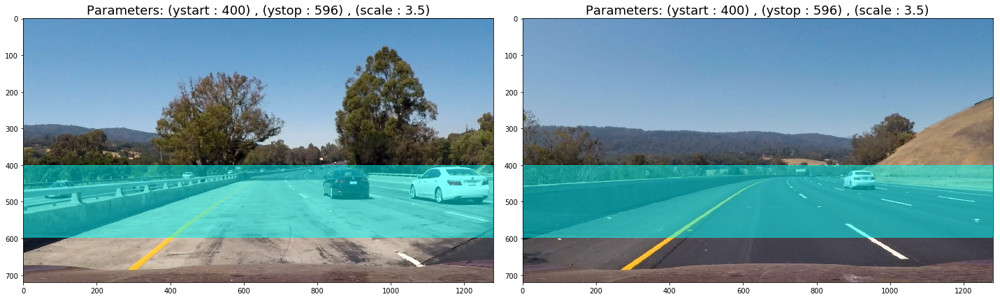

In [299]:
param_visual(400,596,3.5,'400_596_3-5')

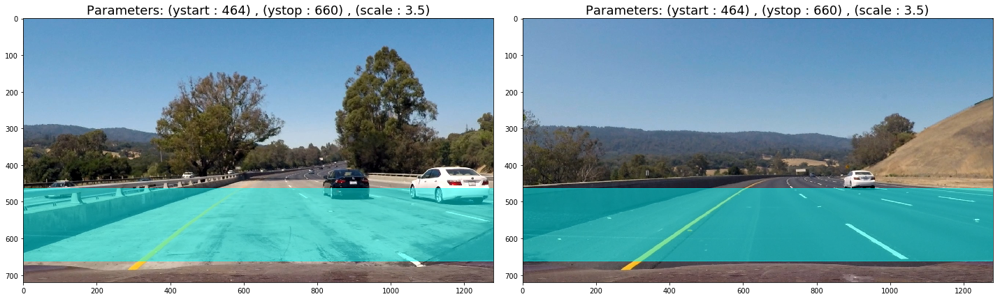

In [300]:
param_visual(464,660,3.5,'464_660_3-5')

### Combining the suitable choices from above

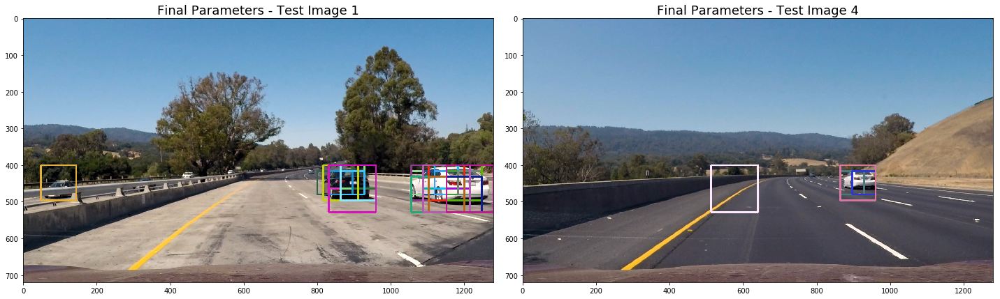

In [297]:
frame_param = [(400,464,1),(416,480,1),(400,496,1.5),(432,528,1.5),(400,528,2),
               (432,560,2),(400,596,3.5),(464,660,3.5)]

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
plt.tight_layout()

index=0
test_img = test_imgs[index]
rectangles = [[],[]]

for frame in frame_param:
    ystart,ystop,scale = frame
    rectangles[0].append(find_cars(test_img, ystart, ystop, scale, color_space, hog_channel, 
                                           svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, 
                                           hist_bins,show_all_rectangles=False))

rectangles[0] = [item for sublist in rectangles[0] for item in sublist]
test_img_rects = draw_boxes(test_img,rectangles[0],color='random')
title = 'Final Parameters - Test Image '+str(index+1)
ax1.set_title(title,fontsize=18)
ax1.imshow(test_img_rects)

index=3
test_img = test_imgs[index]

for frame in frame_param:
    ystart,ystop,scale = frame
    rectangles[1].append(find_cars(test_img, ystart, ystop, scale, color_space, hog_channel, 
                                           svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, 
                                           hist_bins,show_all_rectangles=False))

rectangles[1] = [item for sublist in rectangles[1] for item in sublist]
test_img_rects = draw_boxes(test_img,rectangles[1],color='random')
title = 'Final Parameters - Test Image '+str(index+1)
ax2.set_title(title,fontsize=18)
ax2.imshow(test_img_rects)

plt.show()
f.savefig('output_images/final_frame_parameters',dpi=75,bbox_inches='tight',pad_inches=0.2)
plt.close(f)

## Heatmap and Thresholding
_Source: Udacity SDCEN Lessons_

In [160]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

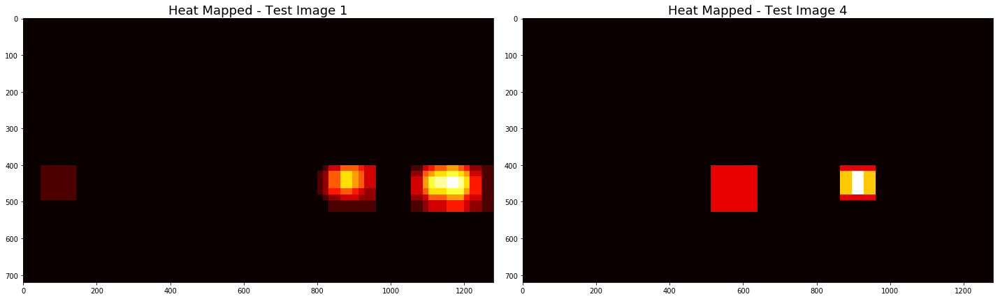

In [108]:
# Test out the heatmap
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
plt.tight_layout()

heatmap_img=[[],[]]
index=0
test_img = test_imgs[index]
heatmap_img[0] = np.zeros_like(test_img[:,:,0])
heatmap_img[0] = add_heat(heatmap_img[0], rectangles[0])
title = 'Heat Mapped - Test Image '+str(index+1)
ax1.set_title(title,fontsize=18)
ax1.imshow(heatmap_img[0], cmap='hot')

index=3
test_img = test_imgs[index]
heatmap_img[1] = np.zeros_like(test_img[:,:,0])
heatmap_img[1] = add_heat(heatmap_img[1], rectangles[1])
title = 'Heat Mapped - Test Image '+str(index+1)
ax2.set_title(title,fontsize=18)
ax2.imshow(heatmap_img[1], cmap='hot')

plt.show()
f.savefig('output_images/heat_mapped',dpi=75,bbox_inches='tight',pad_inches=0.2)
plt.close(f)

In [26]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

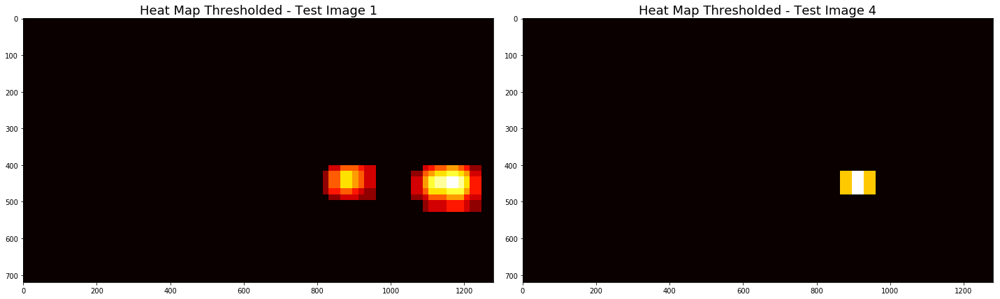

In [109]:
# Test out the heatmap thresholding
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
plt.tight_layout()

#Threshold
threshold = 1

index = 0
heatmap_img[0] = apply_threshold(heatmap_img[0], threshold)
title = 'Heat Map Thresholded - Test Image '+str(index+1)
ax1.set_title(title,fontsize=18)
ax1.imshow(heatmap_img[0], cmap='hot')

index = 3
heatmap_img[1] = apply_threshold(heatmap_img[1], threshold)
title = 'Heat Map Thresholded - Test Image '+str(index+1)
ax2.set_title(title,fontsize=18)
ax2.imshow(heatmap_img[1], cmap='hot')

plt.show()
f.savefig('output_images/heat_map_thresholded',dpi=75,bbox_inches='tight',pad_inches=0.2)
plt.close(f)

### Applying SciPy Labels to Heatmap Images

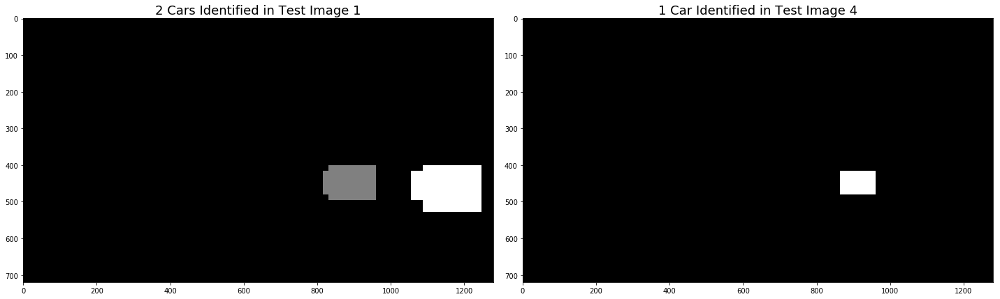

In [110]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
plt.tight_layout()

labels = [[],[]]
index = 0
labels[0] = label(heatmap_img[0])
title = '{} Cars Identified in Test Image {}'.format(labels[0][1], str(index+1))
ax1.set_title(title,fontsize=18)
ax1.imshow(labels[0][0], cmap='gray')

index = 3
labels[1] = label(heatmap_img[1])
title = '{} Car Identified in Test Image {}'.format(labels[1][1], str(index+1))
ax2.set_title(title,fontsize=18)
ax2.imshow(labels[1][0], cmap='gray')

plt.show()
f.savefig('output_images/cars_found',dpi=75,bbox_inches='tight',pad_inches=0.2)
plt.close(f)

### Draw Bounding Boxes for Lables

In [38]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    rects = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        rects.append(bbox)
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,255,150), 3)
    # Return the image and final rectangles
    return img, rects

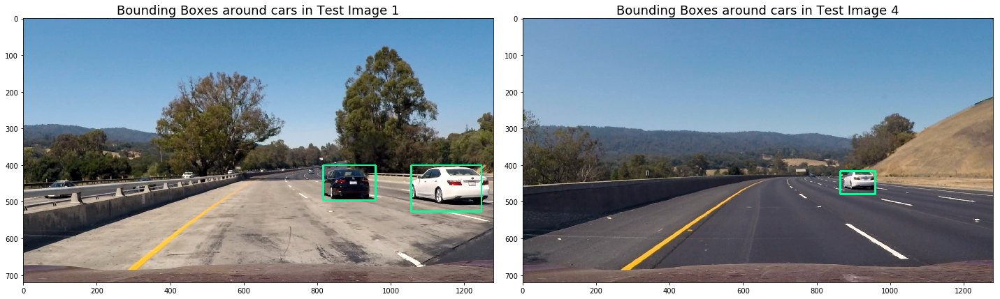

In [39]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,8))
f.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
plt.tight_layout()

index = 0
draw_img, rect = draw_labeled_bboxes(np.copy(test_imgs[index]), labels[0])
title = 'Bounding Boxes around cars in Test Image {}'.format(str(index+1))
ax1.set_title(title,fontsize=18)
ax1.imshow(draw_img)

index = 3
draw_img, rect = draw_labeled_bboxes(np.copy(test_imgs[index]), labels[1])
title = 'Bounding Boxes around cars in Test Image {}'.format(str(index+1))
ax2.set_title(title,fontsize=18)
ax2.imshow(draw_img)

plt.show()
f.savefig('output_images/bounding_boxes',dpi=75,bbox_inches='tight',pad_inches=0.2)
plt.close(f)

## Process Pipeline 
_**Primitive Version:** No frame to frame tracking to eliminate false positives and output a smoother and tightly wrapped bounding box around the detected cars_

In [226]:
def process_frame(img):
    
    color_space = 'LUV'
    spatial_size = (32,32)
    hist_bins = 32
    hog_channel = 'ALL'
    orient = 12
    pix_per_cell = 16
    cell_per_block = 2
    
    config_no = '3'
    path = 'data/doe_results_'+config_no+'.p'
    
    try:
        with open(path, mode='rb') as f:
            data = pickle.load(f)
    finally:
        f.close()
        svc = data['svc']
        X_scaler = data['scaler']
        svc=svc[0]
        X_scaler=X_scaler[0]
    
    rectangles = []
    
    frame_param = [(400,464,1),(416,480,1),(400,496,1.5),(432,528,1.5),(400,528,2),
                   (400,596,3.5),(464,660,3.5)]
    
    for frame in frame_param:
        ystart,ystop,scale = frame
        
        rectangles.append(find_cars(img, ystart, ystop, scale, color_space, hog_channel, 
                                               svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, 
                                               hist_bins,show_all_rectangles=False))
    
    rectangles = [item for sublist in rectangles for item in sublist]
    heatmap_img = np.zeros_like(img[:,:,0])
    heatmap_img = add_heat(heatmap_img, rectangles)
    heatmap_img = apply_threshold(heatmap_img, 1)
    labels = label(heatmap_img)
    draw_img, rects = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

### Testing `process_frame()` pipeline on test images

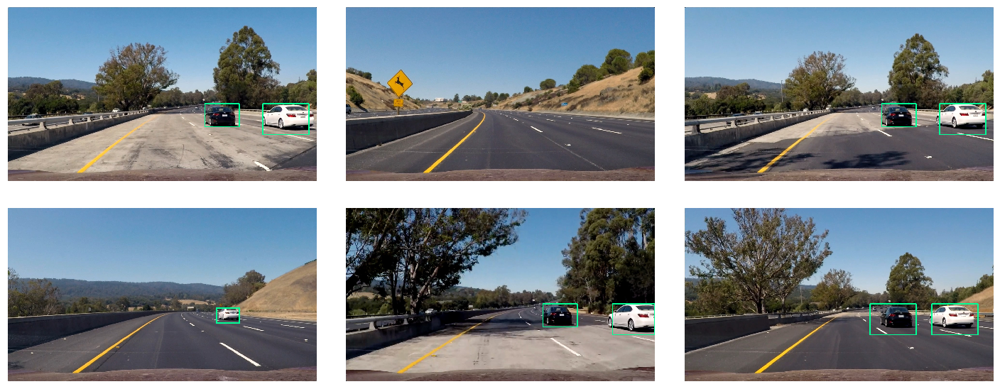

In [227]:
processed_imgs =[]
for test_img in test_imgs:
    processed_imgs.append(process_frame(test_img))

plot_images(processed_imgs,(2,3),(20,8),save_plot=1,filepath='output_images/processed_imgs_vis')

### Testing `process_frame()` pipeline on sample videos

In [232]:
test_out_file_1 = 'test_video_out_1.mp4'
clip_test_1 = VideoFileClip('test_video.mp4')
clip_test_out_1 = clip_test_1.fl_image(process_frame)
%time clip_test_out_1.write_videofile(test_out_file_1, audio=False)

[MoviePy] >>>> Building video test_video_out_1.mp4
[MoviePy] Writing video test_video_out_1.mp4


 97%|█████████▋| 38/39 [00:18<00:00,  2.08it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out_1.mp4 

CPU times: user 17.4 s, sys: 130 ms, total: 17.5 s
Wall time: 22 s


In [3]:
test_out_file_1 = 'test_video_out_1.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_out_file_1))

In [228]:
test_out_file_2 = 'test_video_out_2.mp4'
clip_test_2 = VideoFileClip('project_video.mp4').subclip(8,10)
clip_test_out_2 = clip_test_2.fl_image(process_frame)
%time clip_test_out_2.write_videofile(test_out_file_2, audio=False)

[MoviePy] >>>> Building video test_video_out_2.mp4
[MoviePy] Writing video test_video_out_2.mp4


 98%|█████████▊| 50/51 [00:23<00:00,  1.81it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out_2.mp4 

CPU times: user 21.8 s, sys: 169 ms, total: 21.9 s
Wall time: 27 s


In [4]:
test_out_file_2 = 'test_video_out_2.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_out_file_2))

## Class to record history of Vehicle Detections

In [10]:
class Vehicle_Detect():
    def __init__(self):
        # history of rectangles from previous `n` frames
        self.prev_rects = [] 
        
    def add_rects(self, rects):
        self.prev_rects.append(rects)
        if len(self.prev_rects) > 2:
            # throw out oldest rectangle set(s)
            self.prev_rects = self.prev_rects[len(self.prev_rects)-2:]

## Enhanced Process Pipeline
_**Advanced Version:** This records heat maps from frame to frame for a given time frame. The augmented heatmap of these frames is then thresholded to better eliminate false positives as their heat map weakens out over several frames of no detection. Also the accumulated heat map helps better locate the centroid of the bounding box and its boundaries to tightly wrap the car_

In [300]:
def process_video_frames(img):
    
    color_space = 'LUV'
    spatial_size = (32,32)
    hist_bins = 32
    hog_channel = 'ALL'
    orient = 12
    pix_per_cell = 16
    cell_per_block = 2
    
    config_no = '3'
    path = 'data/doe_results_'+config_no+'.p'
    
    try:
        with open(path, mode='rb') as f:
            data = pickle.load(f)
    finally:
        f.close()
        svc = data['svc']
        X_scaler = data['scaler']
        svc=svc[0]
        X_scaler=X_scaler[0]
    
    rectangles = []
    
    frame_param = [(400,464,1),(416,480,1),(400,496,1.5),(432,528,1.5),(400,528,2),
                   (400,596,3.5),(464,660,3.5)]
    
    for frame in frame_param:
        ystart,ystop,scale = frame
        
        rectangles.append(find_cars(img, ystart, ystop, scale, color_space, hog_channel, 
                                               svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, 
                                               hist_bins,show_all_rectangles=False))
    
    rectangles = [item for sublist in rectangles for item in sublist]
    
    #Adding detections to the history for identifying and eliminating false positives
    if len(rectangles) > 0:
        det.add_rects(rectangles)
        
    heatmap_img = np.zeros_like(img[:,:,0])
    for rect_set in det.prev_rects:
        heatmap_img = add_heat(heatmap_img, rect_set)
    heatmap_img = apply_threshold(heatmap_img,2)
                                  
    labels = label(heatmap_img)
    draw_img, rects = draw_labeled_bboxes(np.copy(img), labels)
    return draw_img

In [303]:
det = Vehicle_Detect()

test_out_file_3 = 'test_video_out_3.mp4'
clip_test_3 = VideoFileClip('test_video.mp4')
clip_test_out_3 = clip_test_3.fl_image(process_video_frames)
%time clip_test_out_3.write_videofile(test_out_file_3, audio=False)

[MoviePy] >>>> Building video test_video_out_3.mp4
[MoviePy] Writing video test_video_out_3.mp4


 97%|█████████▋| 38/39 [00:17<00:00,  2.18it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out_3.mp4 

CPU times: user 16.3 s, sys: 168 ms, total: 16.5 s
Wall time: 20.7 s


In [5]:
test_out_file_3 = 'test_video_out_3.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_out_file_3))

In [292]:
det = Vehicle_Detect()

test_out_file_4 = 'test_video_out_4.mp4'
clip_test_4 = VideoFileClip('project_video.mp4').subclip(8,12)
clip_test_out_4 = clip_test_4.fl_image(process_video_frames)
%time clip_test_out_4.write_videofile(test_out_file_4, audio=False)

[MoviePy] >>>> Building video test_video_out_4.mp4
[MoviePy] Writing video test_video_out_4.mp4


 99%|█████████▉| 100/101 [00:50<00:00,  1.88it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out_4.mp4 

CPU times: user 42.8 s, sys: 313 ms, total: 43.1 s
Wall time: 53 s


In [6]:
test_out_file_4 = 'test_video_out_4.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(test_out_file_4))

### Running `process_video_frames()` pipeline on Project Video

In [301]:
det = Vehicle_Detect()

proj_out_file = 'project_video_out.mp4'
clip_proj = VideoFileClip('project_video.mp4')
clip_proj_out = clip_proj.fl_image(process_video_frames)
%time clip_proj_out.write_videofile(proj_out_file, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [11:23<00:00,  1.82it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 9min 6s, sys: 5.48 s, total: 9min 12s
Wall time: 11min 26s


In [8]:
proj_out_file = 'project_video_out.mp4'

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(proj_out_file))